# Nonrigid alignment of Spateo alignment for 2D slices

Since sectioning experiments often introduce non-rigid deformations, it is crucial to consider the use of non-rigid transformation to align the slices to the coordinates of the reference slices. In this tutorial, we will introduce the how to perform the nonrigid alignment using Spateo and how to tune the degree of non-rigid deformation.

<div class="alert alert-info">

<strong>See also:</strong>

If you are interested in the mathematical details of our nonrigid transformation, please check our post:
[Spatial transcriptomics alignment](../../technicals/spatial_transcriptomics_alignment.md#Spatial_transcriptomics_alignment)

</div>

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import torch
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Running this notebook on: ", device)

import spateo as st
print("Last run with spateo version:", st.__version__)

# Other imports
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import scanpy as sc
import anndata as ad
import numpy as np

# Uncomment the following if running on the server
# import pyvista as pv
# pv.start_xvfb()

%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

Running this notebook on:  cuda


2024-11-11 02:13:23.091378: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-11 02:13:23.812116: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/ylu/anaconda3/envs/Spateo/lib/python3.9/site-packages/cv2/../../lib64:
2024-11-11 02:13:23.812218: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/ylu/anaconda3/envs/Spateo/lib/python3.9

Last run with spateo version: 1.1.0.dev31+16d38fa


## Loading the Data

In this tutorial, we will first demonstrate how Spateo performs nonrigid alignment on Drosophila data obtained using the Stereo-Seq technique. Due to the presence of cavities in the Drosophila embryo, the pressure difference between the interior and exterior during sectioning can easily distort the slices. Using Spateo's alignment, we can effectively recover the original shape of these slices.

To better understand how each parameter influences nonrigid alignment, we then generate pseudo-slices and apply different types of distortions to them. For this demonstration, we use slices from the adult mouse central nervous system, obtained using the STARMap Plus technique. According to the STARMap Plus protocol, each slice has a three-dimensional volume, where the z-axis scale is much smaller than the x and y axes. This allows us to generate pseudo-slices with aligned spatial coordinates. You can download the processed data from the links below. Once downloaded, ensure that you place the data in the appropriate directory.

- [Drosophila E7-9h slice #16](https://drive.google.com/file/d/1eliFZnkVureDnvG0Gdz0ejxsmR2OD_Xh/view?usp=drive_link)
- [Drosophila E7-9h slice #17](https://drive.google.com/file/d/1eksLSPKusw2H-b3y5ad-e4e69g1sLgUT/view?usp=drive_link)
- [Adult mouse central nervous system from STARMap Plus dataset sagittal #3](https://drive.google.com/file/d/1fBHNb80M9yutS2EvXaJMuRQqmvK-rRr5/view?usp=drive_link)

In [2]:
# Load the slices
slice1 = st.read('./data/Drosophila_E7-9h_slice_16.h5ad')
slice2 = st.read('./data/Drosophila_E7-9h_slice_17.h5ad')

slice1, slice2

(AnnData object with n_obs × n_vars = 1229 × 8136
     obs: 'area', 'slices', 'nGenes', 'nCounts', 'pMito', 'nMito', 'pass_basic_filter', 'scc', 'auto_anno', 'anno_cell_type', 'anno_tissue', 'anno_germ_layer', 'actual_stage', 'Size_Factor', 'initial_cell_size'
     obsm: 'spatial'
     layers: 'counts',
 AnnData object with n_obs × n_vars = 996 × 8136
     obs: 'area', 'slices', 'nGenes', 'nCounts', 'pMito', 'nMito', 'pass_basic_filter', 'scc', 'auto_anno', 'anno_cell_type', 'anno_tissue', 'anno_germ_layer', 'actual_stage', 'Size_Factor', 'initial_cell_size'
     obsm: 'spatial'
     layers: 'counts')

The data has already preprocessed so you don't need to do operations like normalization.

We can visualize the slices before alignment. Notably, slice 1 appears significantly shorter than slice 0

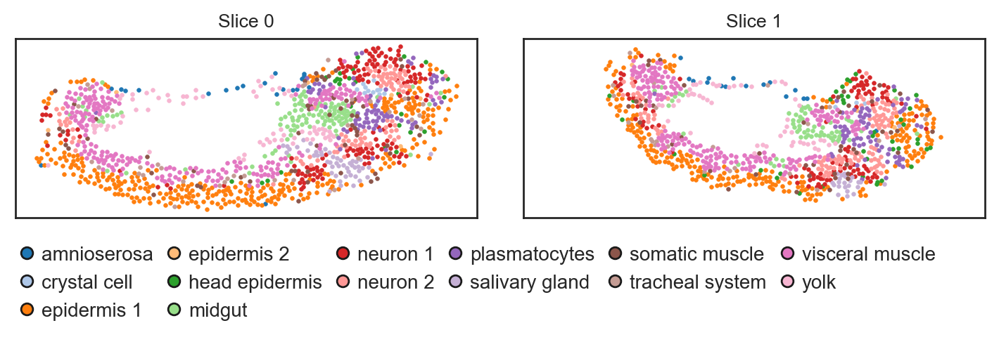

In [3]:
spatial_key = 'spatial'
cluster_key = 'anno_cell_type'

st.pl.slices_2d(
    slices = [slice1, slice2],
    label_key = cluster_key,
    spatial_key = spatial_key,
    height=2,
    center_coordinate=True,
    show_legend=True,
    legend_kwargs={'loc': 'upper center', 'bbox_to_anchor': (0.5, 0) ,'ncol': 6, 'borderaxespad': -2, 'frameon': False},
)

In [4]:
key_added = 'align_spatial'
st.align.group_pca([slice1, slice2], pca_key='X_pca')
aligned_slices, pis = st.align.morpho_align(
    models=[slice1, slice2],
    spatial_key=spatial_key,
    key_added=key_added,
    device=device,
    verbose=True,
    rep_layer='X_pca',
    rep_field='obsm',
    dissimilarity='cos',
    beta=1,
    lambdaVF=1,
    max_iter=500,
    K=100,
)

|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%|-----> Filtered all samples for common genes. There are 8136 common genes.
|-----> Spatial coordinates normalization params:
|-----------> Scale: tensor([247.6963, 247.6963])...
|-----------> Scale: tensor([[388.5977, 163.1790],
        [523.4294, 178.2182]], device='cuda:0')...
|-----> Preprocess finished.
|-----> Performing coarse rigid alignment...
|-----> Coarse rigid alignment done.
|-----> [Start Spateo pairwise alignment] in progress: 100.0000%
|-----> [Start Spateo pairwise alignment] finished [30.6184s]
|-----> Key Parameters: gamma: 0.9481151103973389; sigma2: 0.0031952501740306616; probability_parameters: [tensor(0.0369, device='cuda:0')]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [0.0231s]


After alignment, we can check the overlay of the two slices. The default aligned spatial coordinates stored in `.obsm[key_added]` are rigidly aligned, meaning the slices are primarily aligned in terms of rotation.

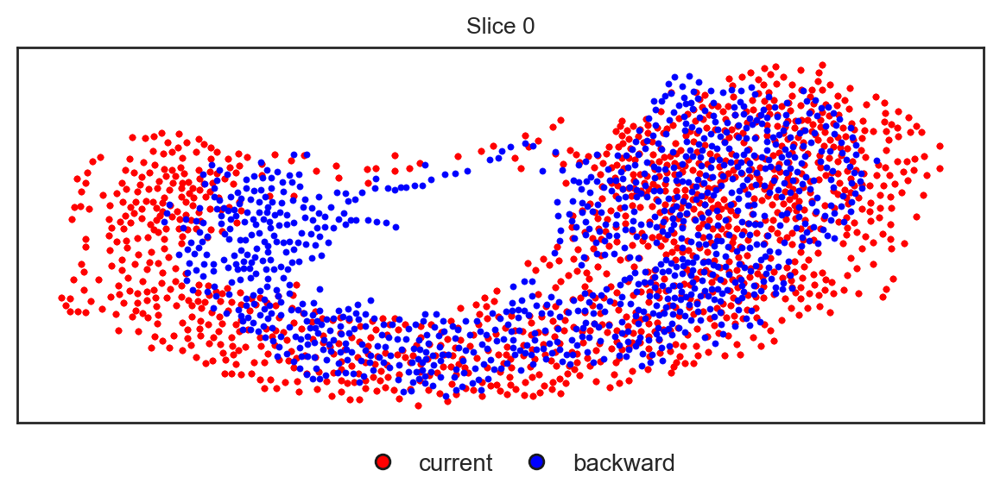

In [5]:
st.pl.overlay_slices_2d(slices = aligned_slices, spatial_key = key_added, height=3, overlay_type='backward', legend_kwargs={'loc': 'upper center', 'bbox_to_anchor': (0.5, 0),'borderaxespad': -2, 'frameon': False},)

<div class="alert alert-info">
<strong>Imporant:</strong>

Spateo alignment adds three keys in .obsm: key_added, key_added + "_rigid", and key_added + "_nonrigid".

By default, Spateo incorporates both rigid and nonrigid (also known as elastic) deformations, and calculates an optimal rigid transformation based on both types of deformation. If you input `SN-S` (which is the default setting) into `mode` in `st.align.morpho_align`, the algorithm assigns the rigid transformation to `key_added` while also retaining the other keys. If you input `SN-N`, then `key_added` will be identical to `key_added + "_nonrigid"`.

In principle, when performing serial pairwise alignment to reconstruct 3D spatial transcriptomics, using nonrigid alignment consistently can accumulate distortions across slices. Therefore, the default setting is `SN-S`. We recommend that users first perform rigid alignment and then decide whether to apply nonrigid alignment for specific slices when reconstructing 3D spatial transcriptomics of tissues or embryos.

We can check the nonrigid alignment in `key_added+'_nonrigid'`. We can see that the two slices now align very well both globally and locally.

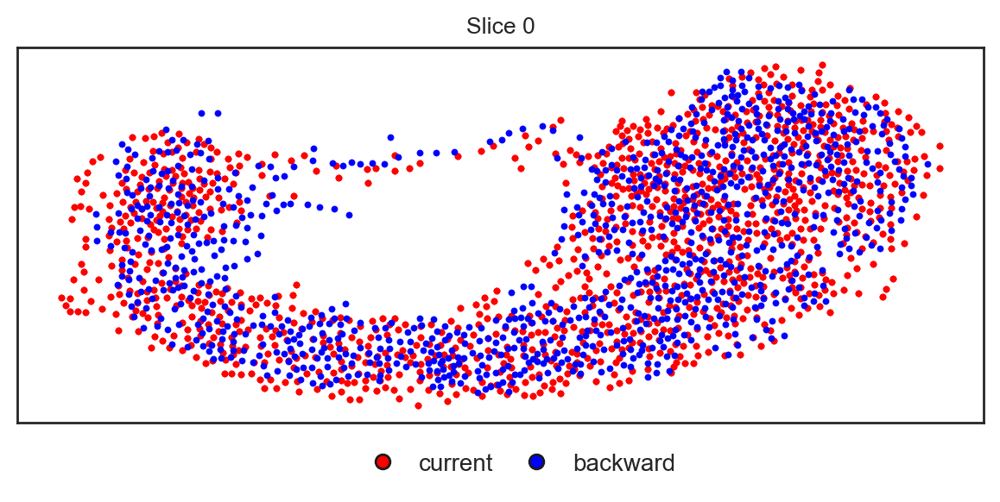

In [7]:
st.pl.overlay_slices_2d(slices = aligned_slices, spatial_key = key_added+'_nonrigid', height=3, overlay_type='backward', legend_kwargs={'loc': 'upper center', 'bbox_to_anchor': (0.5, 0),'borderaxespad': -2, 'frameon': False},)

Let's visualize the optimization process to see how the two slices align step by step. This can help us understand how Spateo iteratively refines the alignment from the initial state to the final well-aligned state

In [9]:
st.pl.optimization_animation(
    aligned_slices = aligned_slices,
    spatial_key=spatial_key,
    key_added=key_added,
    iter_key_added = "iter_spatial",
    filename = "./results/optimization_animate",
    fps = 10,
    stepsize = 10,
    label_key='anno_cell_type',
)

<img src="./results/optimization_animate.gif" alt="Alt Text" width="800" height="500">

## Explore the nonrigid related parameters: beta, lambdaVF, K

Now, we want to further understand how the nonrigid-related parameters influence the nonrigid alignment results. For this purpose, we will use the STARMap Plus data and manually control the distortion levels.

In [2]:
# Load the STARMap Plus slice
adata = st.read('./data/sagittal3.h5ad')

print(adata)
print(adata.obsm['spatial_raw'].shape)

AnnData object with n_obs × n_vars = 207591 × 1022
    obs: 'Sub_molecular_cell_type', 'Main_molecular_tissue_region', 'Sub_molecular_tissue_region', 'Molecular_spatial_cell_type', 'n_genes'
    var: 'n_cells'
    uns: 'Main_molecular_tissue_region_palette', 'log1p', 'pca'
    obsm: 'X_pca', 'spatial', 'spatial_raw'
    varm: 'PCs'
    layers: 'counts'
(207591, 3)


## Visualize the STARMap Plus slice in 3D

<div class="alert alert-warning">
<strong>Warning:</strong>

The following code block involves [PyVista](https://docs.pyvista.org/) visualization. Before running the PyVista-based visualization function `st.pl.three_d_plot`, please ensure that PyVista is installed correctly, especially for server configurations. Incorrect installation may cause Jupyter Notebook to crash. There are certain specifications to consider when running PyVista on a remote server. We recommend reviewing their [tutorials](https://docs.pyvista.org/user-guide/jupyter/trame.html#remote-jupyter-host), particularly for remote Jupyter environments.
    
</div>

As the STARMap Plus slice has a three-dimensional volume, we can perform pseudo-sectioning on it. The slice is visualized in 3D space below. If you prefer not to display the visualization, you can skip this step.

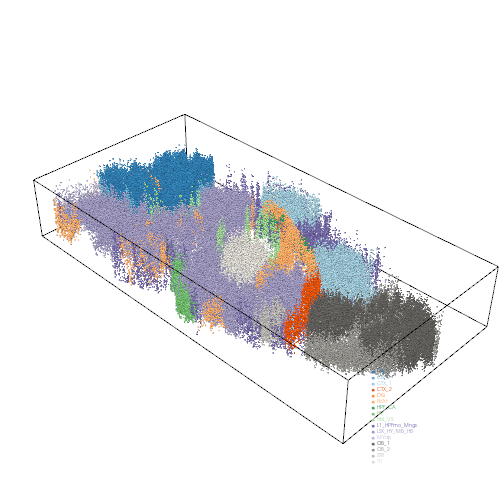

In [3]:
point_cloud, _ = st.tdr.construct_pc(adata=adata,spatial_key="spatial_raw",groupby="Main_molecular_tissue_region",key_added="tissue",colormap='tab20c',)

# make the z height bigger
point_cloud.points[:,2] *= 500

# show the STARMap Plus slice in 3D
st.pl.three_d_plot(
    model=point_cloud,
    key="tissue",
    model_style='points',
    model_size=2,
    jupyter="static",
    window_size=(500, 500),
    show_outline=True,
    outline_kwargs={'show_labels': False, 'outline_width': 1},
)

## Cut along z-axis to generate pseudo slices

Next, we cut the STARMap Plus slice along the z-axis to generate four pseudo-slices. It's important to note that this strategy for generating pseudo-slices is not equivalent to random sampling, as the spatial distribution of the STARMap Plus slice along the z-axis will also vary.

In [3]:
slices = st.align.split_slice(adata=adata,spatial_key='spatial_raw',split_num=8,axis=2,)
slices[:2]

[AnnData object with n_obs × n_vars = 25948 × 1022
     obs: 'Sub_molecular_cell_type', 'Main_molecular_tissue_region', 'Sub_molecular_tissue_region', 'Molecular_spatial_cell_type', 'n_genes', 'slice'
     var: 'n_cells'
     uns: 'Main_molecular_tissue_region_palette', 'log1p', 'pca'
     obsm: 'X_pca', 'spatial', 'spatial_raw'
     varm: 'PCs'
     layers: 'counts',
 AnnData object with n_obs × n_vars = 25948 × 1022
     obs: 'Sub_molecular_cell_type', 'Main_molecular_tissue_region', 'Sub_molecular_tissue_region', 'Molecular_spatial_cell_type', 'n_genes', 'slice'
     var: 'n_cells'
     uns: 'Main_molecular_tissue_region_palette', 'log1p', 'pca'
     obsm: 'X_pca', 'spatial', 'spatial_raw'
     varm: 'PCs'
     layers: 'counts']

Despite having the same number of cells, the spatial distribution varies significantly from section to section, as shown below

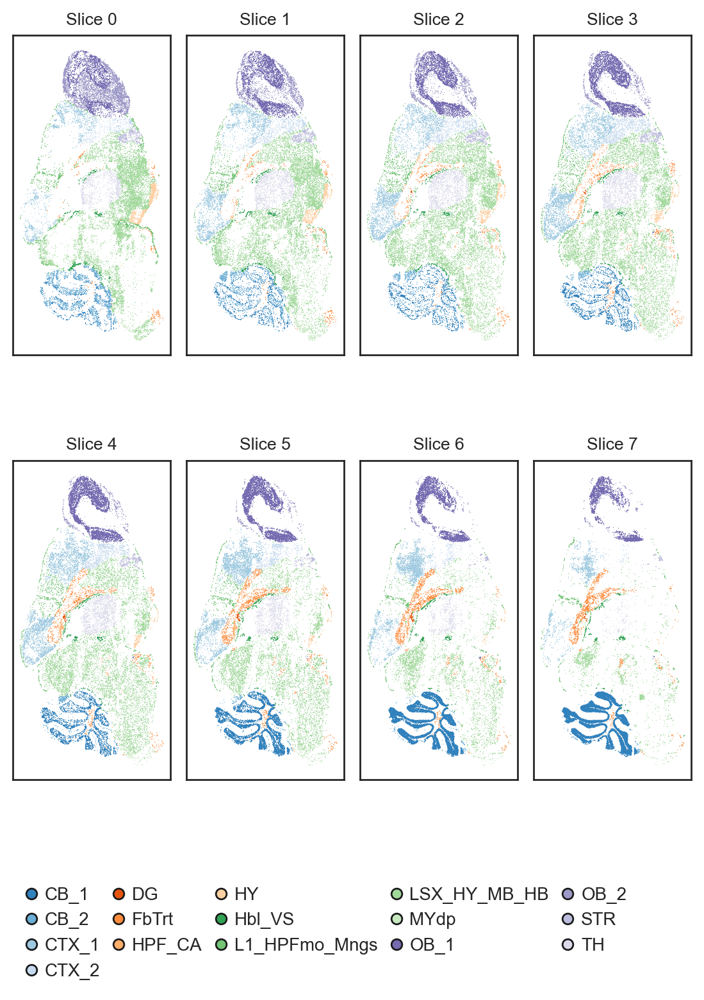

In [5]:
spatial_key = 'spatial_raw'
cluster_key = 'Main_molecular_tissue_region'

st.pl.slices_2d(
    slices = slices,
    label_key = cluster_key,
    spatial_key = spatial_key,
    height=4,
    center_coordinate=False,
    show_legend=True,
    legend_kwargs={'loc': 'upper center', 'bbox_to_anchor': (0.49, 0) ,'ncol': 5, 'borderaxespad': -4, 'frameon': False},
    cmap='tab20c',
)

## Simulate nonrigid deformation using thin-plate-spine

To simulate non-rigid deformation, we use the thin-plate-spine or TPS algorithm (implemented from thin-plate-spine package). You can control the distortion level using the "tps_noise_scale" parameter. A higher value means the distortion is more significant, and vice verse. 

In [4]:
slice1 = slices[0].copy()
slice2 = slices[1].copy()
tps_f = st.align.tps_deformation(
    adata=slice2,
    spatial_key='spatial',
    key_added='tps_spatial',
    tps_noise_scale=0.15,
)
slice1.obsm['tps_spatial'] = slice1.obsm['spatial'].copy()

After the TPS algorithm, the spatial distribution of slice2 is significantly distorted.

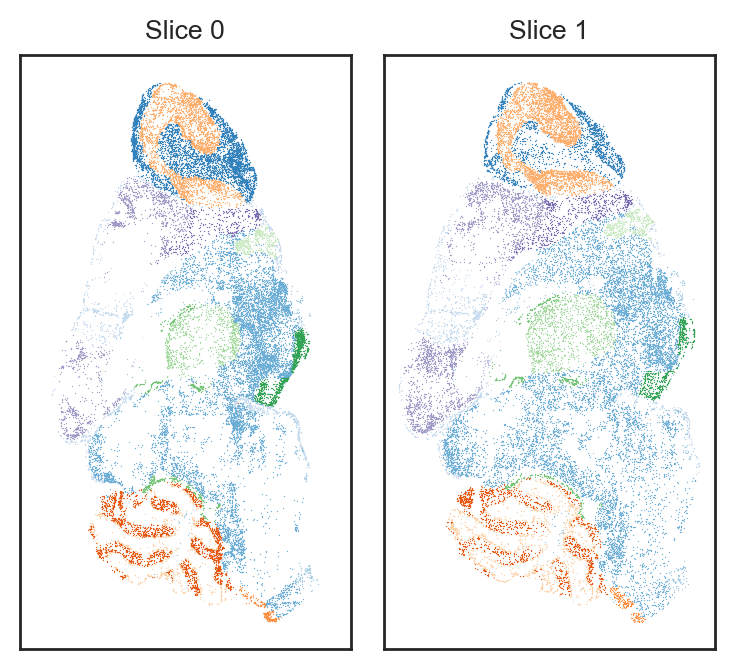

In [5]:
spatial_key = 'tps_spatial'
cluster_key = 'Main_molecular_tissue_region'

st.pl.slices_2d(
    slices = [slice1, slice2],
    label_key = cluster_key,
    spatial_key = spatial_key,
    height=4,
    center_coordinate=False,
    show_legend=False,
    legend_kwargs={'loc': 'upper center', 'bbox_to_anchor': (0.49, 0) ,'ncol': 5, 'borderaxespad': -4, 'frameon': False},
    palette='tab20c',
)

We can also plot the deformaiton grid to show the distortion.

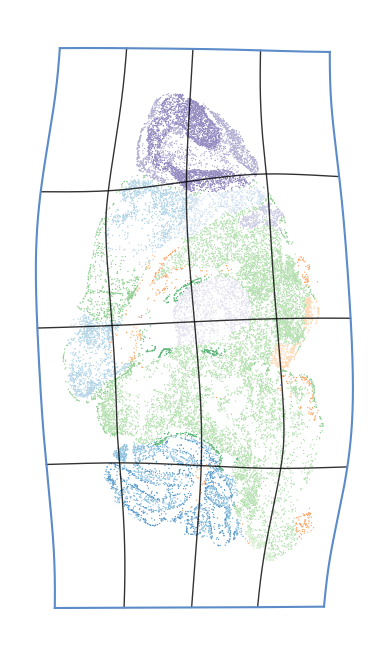

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
st.pl.plot_deformation_grid(
    slice2, 
    spatial_key,
    'spatial',
    cluster_key,
    tps_f,
    ax,
    0.2,
    grid_num=5,
    line_width=0.5,
    grid_color="black",
    expand_scale = 0.1,
    palette = 'tab20c',
    title = '',
    legend=True,
    fontsize=8,
    fill=False,
)
plt.show()

Overlay the slice 2 before and after TPS distortion, we can see the shape difference

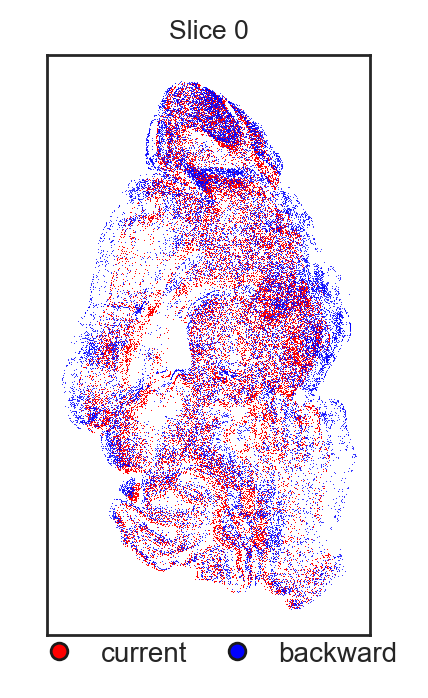

In [7]:
slice2_original = slice2.copy()
slice2_original.obsm['tps_spatial'] = slice2_original.obsm['spatial'].copy()
st.pl.overlay_slices_2d(slices = [slice2_original, slice2], spatial_key = 'tps_spatial', height=4, overlay_type='backward')

## Spateo Nonrigid Alignment

Next, we use Spateo nonrigid alignment to align these two slices. Please note that we set `beta=1`, `lambdaVF=1`, `max_iter=300`, and `K=100` (increasing `beta` and `K`, and decreasing `lambdaVF`, will make the nonrigid alignment more flexible). You can also try other parameter settings, which we will investigate later.

In [8]:
key_added = 'align_spatial'
spatial_key = 'tps_spatial'
aligned_slices, pis = st.align.morpho_align(
    models=[slice1, slice2],
    spatial_key=spatial_key,
    key_added=key_added,
    device=device,
    verbose=True,
    rep_layer='X_pca',
    rep_field='obsm',
    dissimilarity='cos',
    beta=1,
    lambdaVF=1,
    max_iter=300,
    K=100,
)

|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%|-----> Filtered all samples for common genes. There are 1022 common genes.
|-----> Spatial coordinates normalization params:
|-----------> Scale: tensor([22278.5156, 22278.5156])...
|-----------> Scale: tensor([[21866.8418, 41613.0234],
        [22935.1621, 42582.5859]], device='cuda:0')...
|-----> Preprocess finished.
|-----> Performing coarse rigid alignment...
|-----> Coarse rigid alignment done.
|-----> [Start Spateo pairwise alignment] in progress: 100.0000%
|-----> [Start Spateo pairwise alignment] finished [6.9431s]
|-----> Key Parameters: gamma: 0.9900000095367432; sigma2: 0.0010000000474974513; probability_parameters: [tensor(0.0102, device='cuda:0')]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [0.2329s]


In [9]:
st.pl.optimization_animation(
    aligned_slices = aligned_slices,
    spatial_key=spatial_key,
    key_added=key_added,
    iter_key_added = "iter_spatial",
    filename = "./results/optimization_animate_starmap",
    fps = 10,
    stepsize = 10,
    label_key=cluster_key,
    n_sampling=20000,
)

<img src="./results/optimization_animate_starmap.gif" alt="Alt Text" width="800" height="500">

## Investigate Parameters Settings in Spateo Nonrigid Alignment
Theoretically, three parameters control the degree of nonrigid deformation in Spateo. We describe each parameter below:

- **beta**: [Flexibility of nonrigid transformation] The length scale of the squared exponential (SE) kernel. A larger value means less correlation between points and more flexible nonrigid deformation, and vice versa. The default is `1e-2`. Recommended setting range: `[1e-4, 1e0]`.

- **lambdaVF**: [Strength of nonrigid transformation] The regularization parameter for the vector field of the nonrigid transformation. A smaller value means fewer constraints on nonrigid deformation, allowing for larger and more flexible deformations, and vice versa. The default is `1e2`. Recommended setting range: `[1e-1, 1e4]`.

- **K**: [Basis of nonrigid transformation] The number of sparse inducing points used for Nyström approximation of the kernel. A larger value allows for more complex relationships to be approximated, making the deformation more flexible, but it also increases computational overhead. The default is `15`. Recommended setting range: `[15, 500]`.

Next, we show the influence of different parameter settings. As we have the pseudo-slices' ground-truth spatial coordinates, we can directly measure the mean absolute error to validate the results. Here, we iterate through different parameter settings.

In [10]:
beta_list = [1e-4, 1e-3, 1e-2, 1e-1, 1]
lambdaVF_list = [1e-1, 1e0, 1e1, 1e2, 1e3, 1e4]

# iterate all the parameters
aligned_slices = [slice1.copy(), slice2.copy()]
spatial_key = 'tps_spatial'
for beta in beta_list:
    for lambdaVF in lambdaVF_list:
        key_added = f"align_spatial_{beta}_{lambdaVF}"
        aligned_slices, pis = st.align.morpho_align(
            models=aligned_slices,
            spatial_key=spatial_key,
            key_added=key_added,
            device=device,
            beta=beta,
            lambdaVF=lambdaVF,
            verbose=False,
            rep_layer='X_pca',
            rep_field='obsm',
            dissimilarity='cos',
        )

|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.1392s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.0994s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.0861s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.0925s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.1156s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [5.9096s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.000

We plot the overlay of the aligned slices with different values of beta. When `beta=1e-4`, the alignment behaves more like a rigid transformation, resulting in poorly aligned local structures. As beta increases, the nonrigid alignment becomes more flexible and achieves better alignment of local structures. The same trend applies to the parameter `lambdaVF`.


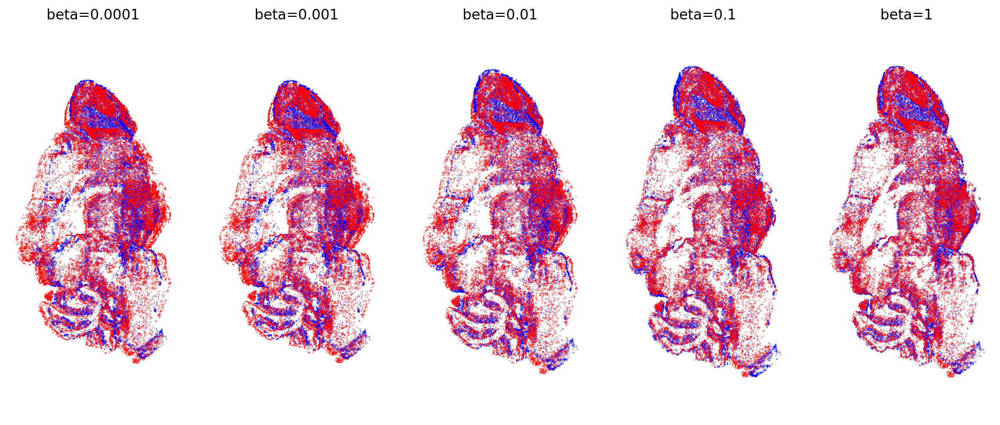

In [11]:
lambdaVF = 1e3
fig, axs = plt.subplots(1, 5, figsize=(15,6))
point_size=0.02
for i, beta in enumerate(beta_list):
    key_added = f"align_spatial_{beta}_{lambdaVF}_nonrigid"
    slice1_spatial = aligned_slices[0].obsm['spatial']
    slice2_spaital = aligned_slices[1].obsm[key_added]
    axs[i].scatter(*slice1_spatial.T, s=point_size, c='blue', label='slice1', edgecolor=None)
    axs[i].scatter(*slice2_spaital.T, s=point_size, c='red', label='slice2', edgecolor=None)
    axs[i].set_title(f"beta={beta}")
    axs[i].axis('equal')
    axs[i].axis('off')
plt.show()

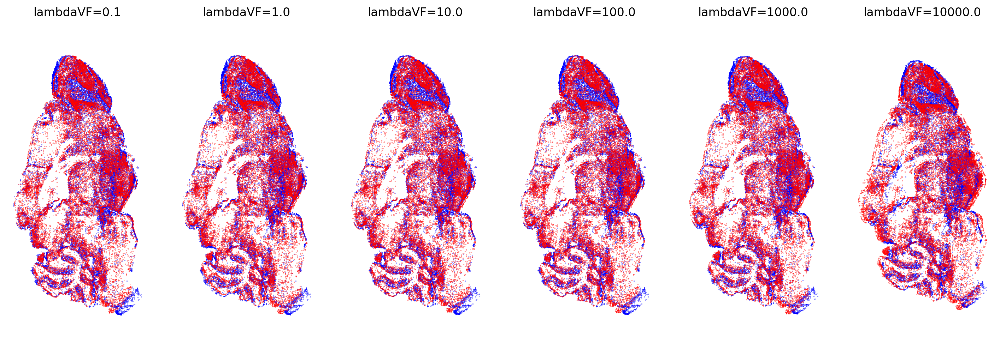

In [12]:
beta = 1e-1
fig, axs = plt.subplots(1, 6, figsize=(18, 6))
point_size=0.02
for i, lambdaVF in enumerate(lambdaVF_list):
    key_added = f"align_spatial_{beta}_{lambdaVF}_nonrigid"
    slice1_spatial = aligned_slices[0].obsm['spatial']
    slice2_spaital = aligned_slices[1].obsm[key_added]
    axs[i].scatter(*slice1_spatial.T, s=point_size, c='blue', label='slice1', edgecolor=None)
    axs[i].scatter(*slice2_spaital.T, s=point_size, c='red', label='slice2', edgecolor=None)
    axs[i].set_title(f"lambdaVF={lambdaVF}")
    axs[i].axis('equal')
    axs[i].axis('off')
plt.show()

To quantify the alignment result, we compute the mean absoulte errors and draw the heatmap

In [14]:
def MAE(
    spatial1,
    spatial2,
    return_err = False,
):
    if len(spatial1.shape) == 3:
        spatial1 = spatial1[:, :2]
    if len(spatial2.shape) == 3:
        spatial2 = spatial2[:, :2]
    ae = np.linalg.norm(spatial1 - spatial2, axis=1)
    mae = np.mean(ae)
    mae_var = np.mean((ae - mae)**2)
    if return_err:
        return mae, mae_var, ae
    else:
        return mae, mae_var

In [15]:
maes = np.zeros((len(beta_list), len(lambdaVF_list)))
for i, beta in enumerate(beta_list):
    for j, lambdaVF in enumerate(lambdaVF_list):
        key_added = f"align_spatial_{beta}_{lambdaVF}"
        maes[i, j], _ = MAE(aligned_slices[1].obsm['spatial'], aligned_slices[1].obsm[f'{key_added}_nonrigid'])

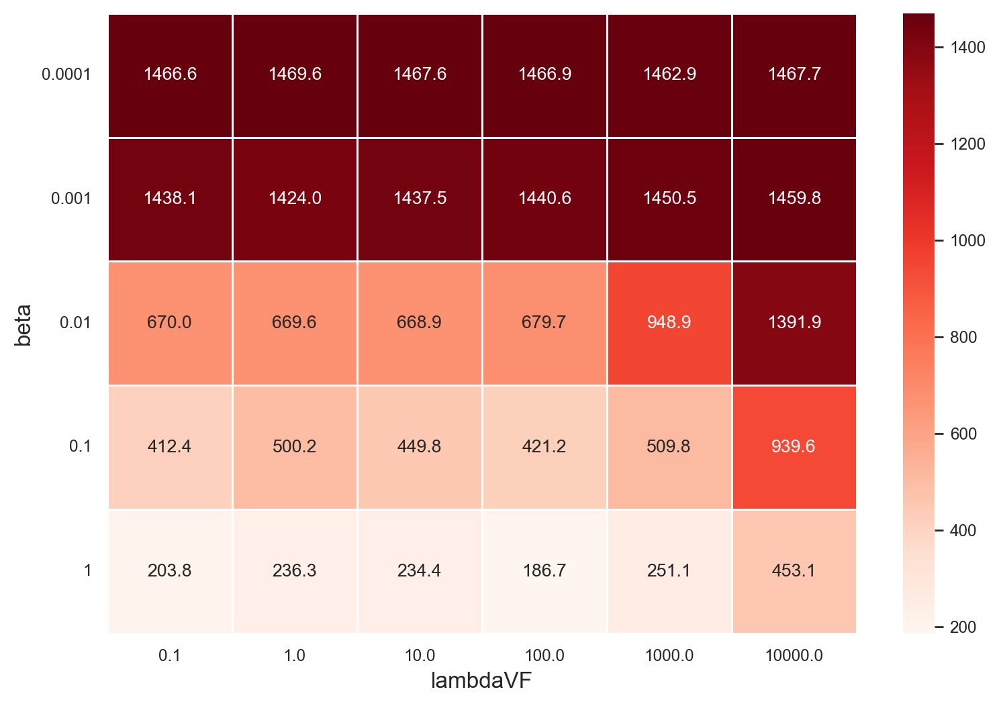

In [16]:
import seaborn as sns
sns.set_theme(
    context="paper",
    style="white",
    font="Arial",
    font_scale=1,
    rc={
        "font.family": ["sans-serif"],
        "font.sans-serif": ["Arial", "sans-serif", "Helvetica", "DejaVu Sans", "Bitstream Vera Sans"],
    },
)
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(maes, annot=True, fmt=".1f", linewidths=.5, ax=ax,cmap='Reds')
ax.set_xticklabels(lambdaVF_list)
ax.set_yticklabels(beta_list, rotation=0)
ax.set_xlabel('lambdaVF', fontdict={'size': 12})
ax.set_ylabel('beta', fontdict={'size': 12})
plt.show()

Let's check the best setting in this case

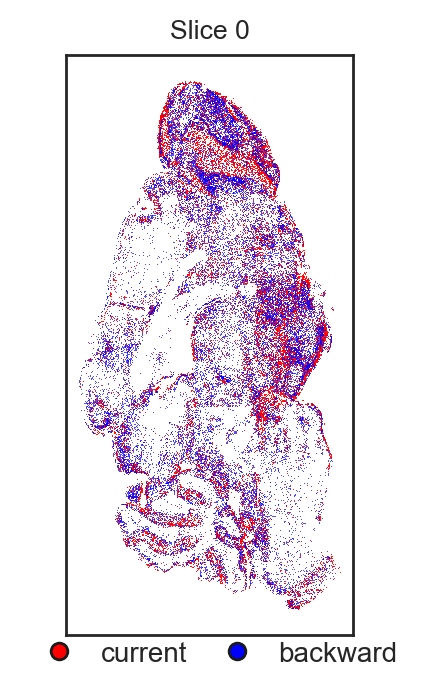

In [19]:
beta = 1
lambdaVF = 100.0
key_added = f"align_spatial_{beta}_{lambdaVF}_nonrigid"
aligned_slices[0].obsm[key_added] = aligned_slices[0].obsm['spatial']
st.pl.overlay_slices_2d(slices = aligned_slices, spatial_key = key_added, height=4, overlay_type='backward')

## Iterate with K

Next, we fix beta=1 and lambdaVF=100, and change the K value.

In [21]:
import time
K_list = [3, 5, 10, 15, 30, 50, 100, 200, 500, 1000]
t_list = []
# iterate all the parameters
aligned_slices = [slice1.copy(), slice2.copy()]
spatial_key = 'tps_spatial'
for K in K_list:
    key_added = f"align_spatial_{K}"
    t_start = time.time()
    aligned_slices, pis = st.align.morpho_align(
        models=aligned_slices,
        spatial_key=spatial_key,
        key_added=key_added,
        device=device,
        beta=1,
        lambdaVF=1e2,
        K=K,
        verbose=False,
        rep_layer='X_pca',
        rep_field='obsm',
        dissimilarity='cos',
    )
    t_end = time.time()
    t = t_end - t_start
    t_list.append(t)

|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [5.8253s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [5.9948s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.0067s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.0457s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.1322s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.3636s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.000

In [22]:
maes = np.zeros((len(K_list), ))
for i, K in enumerate(K_list):
    key_added = f"align_spatial_{K}"
    maes[i], _ = MAE(aligned_slices[1].obsm['spatial'], aligned_slices[1].obsm[f'{key_added}_nonrigid'])

We can see that increasing `K` helps improve the performance when `K` is small (e.g., less than 30). However, further increases do not necessarily improve the alignment results. When `K` is too large (e.g., `K = 1000`), the performance even worsens because excessive flexibility can negatively impact alignment. Additionally, note that increasing `K` also adds to the running time.

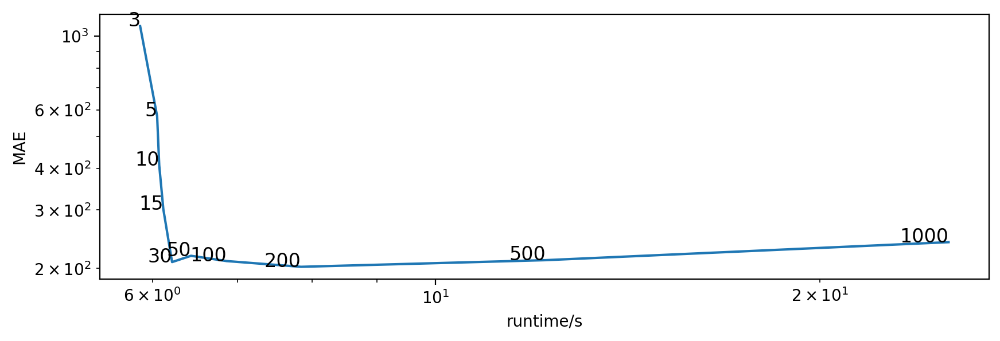

In [32]:
fig, ax = plt.subplots(1, 1, figsize=(10, 3))
ax.plot(t_list, maes)

for i, (x, y) in enumerate(zip(t_list, maes)):
    ax.text(x, y, f'{K_list[i]}', fontsize=12, ha='right')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('runtime/s')
ax.set_ylabel('MAE')
plt.show()

## Iterate with different distortion level

Next, we demonstrate how Spateo performs under different levels of distortion. We iteratively generate distorted slices using varying distortion levels and align them with Spateo.

In [33]:
distortion_level = [0, 0.01, 0.02, 0.05, 0.08, 0.1, 0.15, 0.2, 0.3, 0.4]
distorted_slices = []
for i in range(len(distortion_level)):
    _ = st.align.tps_deformation(
        adata=slice2,
        spatial_key='spatial',
        key_added='tps_spatial',
        tps_noise_scale=distortion_level[i],
    )
    distorted_slices.append(slice2.copy())

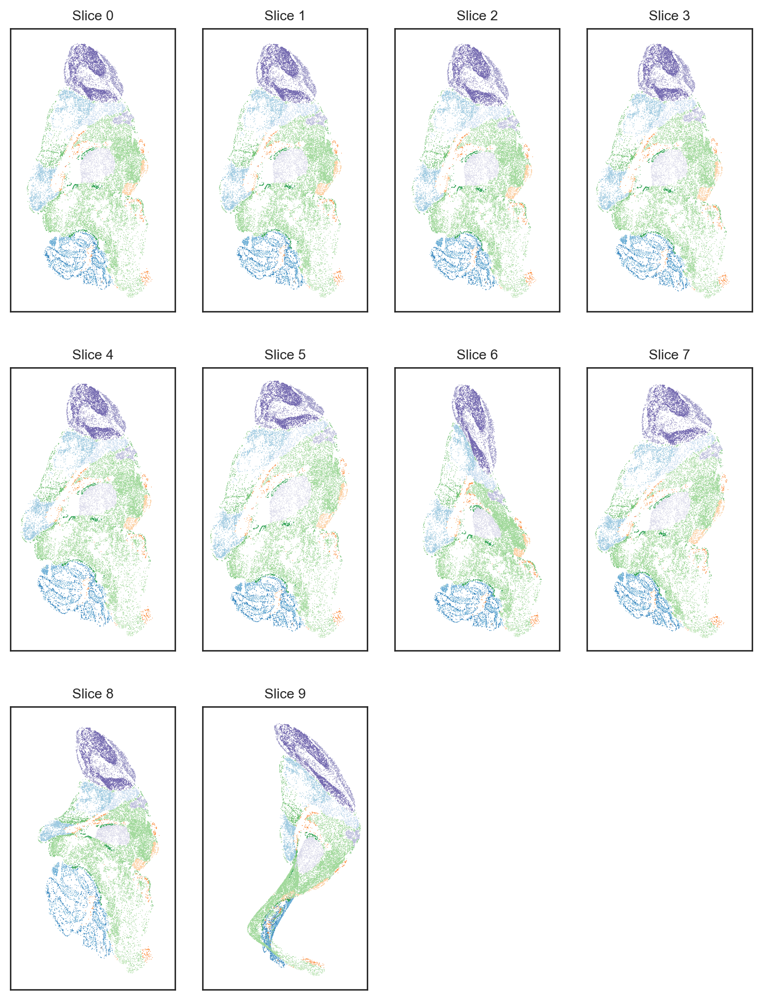

In [34]:
spatial_key = 'tps_spatial'
cluster_key = 'Main_molecular_tissue_region'

st.pl.slices_2d(
    slices = distorted_slices,
    label_key = cluster_key,
    spatial_key = spatial_key,
    height=4,
    center_coordinate=False,
    show_legend=False,
    legend_kwargs={'loc': 'upper center', 'bbox_to_anchor': (0.49, 0) ,'ncol': 5, 'borderaxespad': -4, 'frameon': False},
    palette='tab20c',
)

In [35]:
spatial_key = 'tps_spatial'
aligned_slices_list = []
for i in range(len(distortion_level)):
    aligned_slices = [slice1.copy(), distorted_slices[i].copy()]
    key_added = f"align_spatial"
    aligned_slices, pis = st.align.morpho_align(
        models=aligned_slices,
        spatial_key=spatial_key,
        key_added=key_added,
        device=device,
        beta=1,
        lambdaVF=1e2,
        K=50,
        verbose=False,
        rep_layer='X_pca',
        rep_field='obsm',
        dissimilarity='cos',
    )
    aligned_slices_list.append(aligned_slices)

|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.1874s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.1410s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.2041s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.1891s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.1353s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.0000%
|-----> [Models alignment based on morpho, mode: SN-S.] finished [6.1369s]
|-----> [Models alignment based on morpho, mode: SN-S.] in progress: 100.000

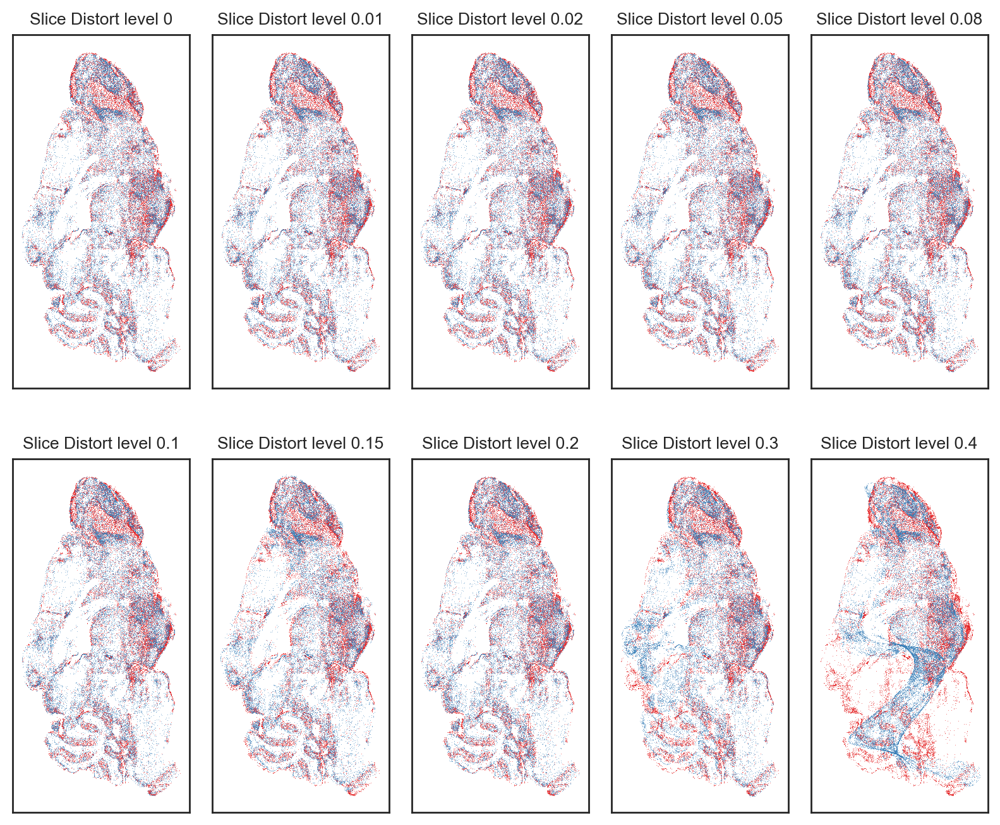

In [46]:
concat_aligned_slices = [ad.concat(a_s, label='batch') for a_s in aligned_slices_list]
for i in range(len(concat_aligned_slices)):
    concat_aligned_slices[i].obs['distort_level'] = 'Distort level ' + str(distortion_level[i])
st.pl.slices_2d(
    slices = concat_aligned_slices,
    label_key = 'batch',
    spatial_key = 'align_spatial_nonrigid',
    height=4,
    center_coordinate=False,
    show_legend=False,
    legend_kwargs={'loc': 'upper center', 'bbox_to_anchor': (0.49, 0) ,'ncol': 5, 'borderaxespad': -4, 'frameon': False},
    palette='Set1',
    ncols=5,
    slices_key='distort_level',
)

## Conclusion

In this tutorial, we've demonstrated how to perform nonrigid alignment using Spateo. Spateo can accurately and efficiently correct the distortion of slices by aligning them to a reference slice. We further demonstrated some parameters that affect Spateo's nonrigid alignment: beta, lambdaVF, and K. Note that increasing beta and K, and decreasing lambdaVF, will make the nonrigid alignment more flexible. However, increasing K will also slow down the computation with minimal accuracy gain.

<div class="alert alert-warning">
<strong>Warning:</strong>
    
Although nonrigid alignment is better for aligning local structures, it may not always be the best choice in 3D reconstruction. Consecutive slices are inherently different, and it's often unclear whether the deformation in a slice is due to distortions during slicing or reflects the original structure. To help with this, we offer a tutorial on how to determine when to use nonrigid alignment in 3D reconstruction.

When to use nonrigid in 3D reconstruction: [3D reconstruction with pairwise alignment](./3D%20reconstruction%20with%20pairwise%20alignment.ipynb)
    
</div>